In [26]:
part1_path = "/kaggle/input/assignment5/Part 1/"
part2_path = "/kaggle/input/assignment5/Part 2/"
other_path = "/kaggle/input/assignment5/"

output_path = "/kaggle/working/"

In [2]:
# Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth


#### Applying a Haar-like filter

In [3]:
def apply_haar_filter(image, filter_type):
    channels = cv2.split(image)
    if filter_type == 'rectangle':
        kernel = np.ones((12, 6), np.float32)
        kernel[:, :3] = -1  
    elif filter_type == 'square':
        kernel = np.ones((12, 12), np.float32)
        kernel[:6, :] = -1  
    else:
        raise ValueError("Unsupported filter type.")
    
    filtered_img = cv2.merge([cv2.filter2D(i, -1, kernel) for i in channels])
    
    return filtered_img

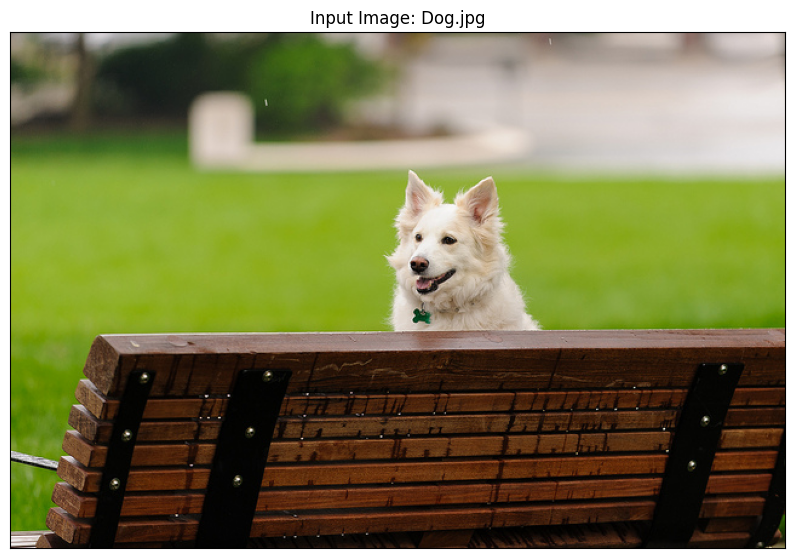

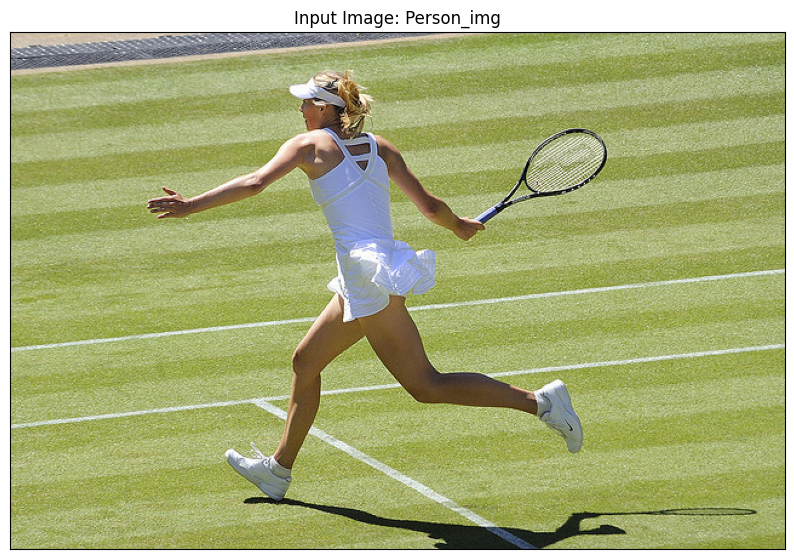

In [4]:
# Displaying images
dog_img = cv2.imread(part1_path + "Dog.jpg")
dog_img_rgb = cv2.cvtColor(dog_img, cv2.COLOR_BGR2RGB)

person_img = cv2.imread(part1_path + "Person.jpg")
person_img_rgb = cv2.cvtColor(person_img, cv2.COLOR_BGR2RGB)


plt.figure(figsize=(10,10))
plt.imshow(dog_img_rgb)
plt.title("Input Image: Dog.jpg"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(person_img_rgb)
plt.title("Input Image: Person_img"), plt.xticks([]), plt.yticks([])
plt.show()

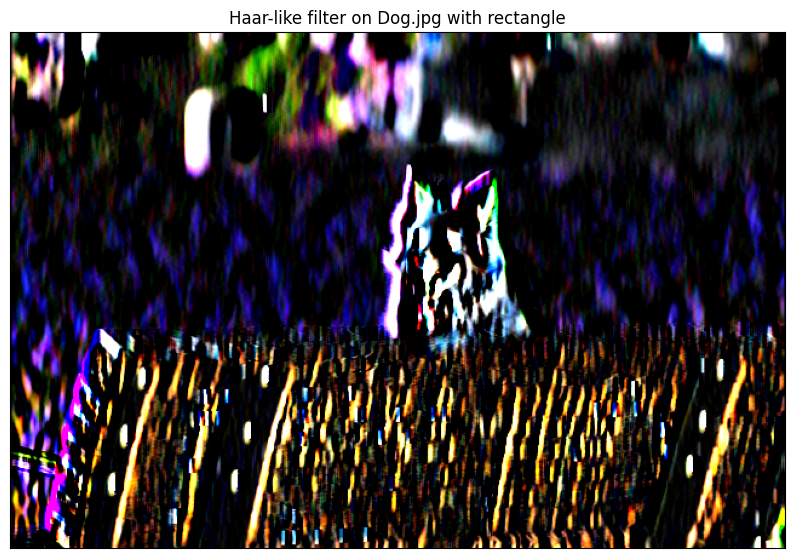

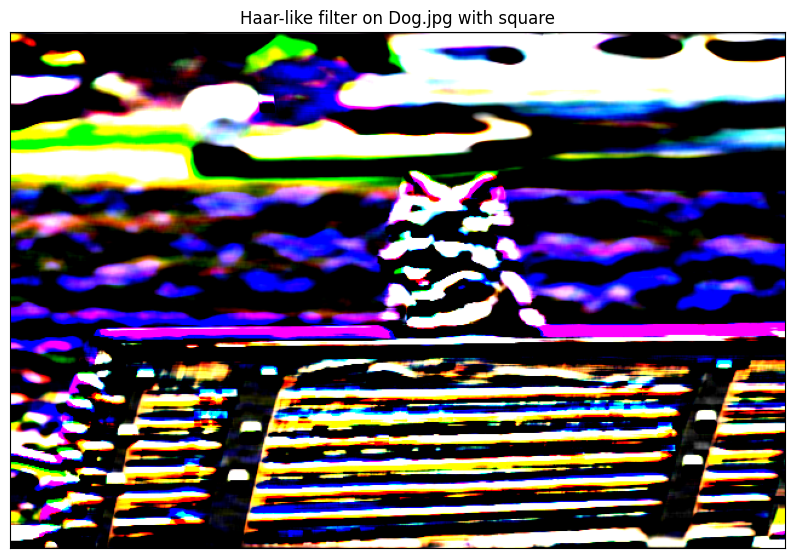

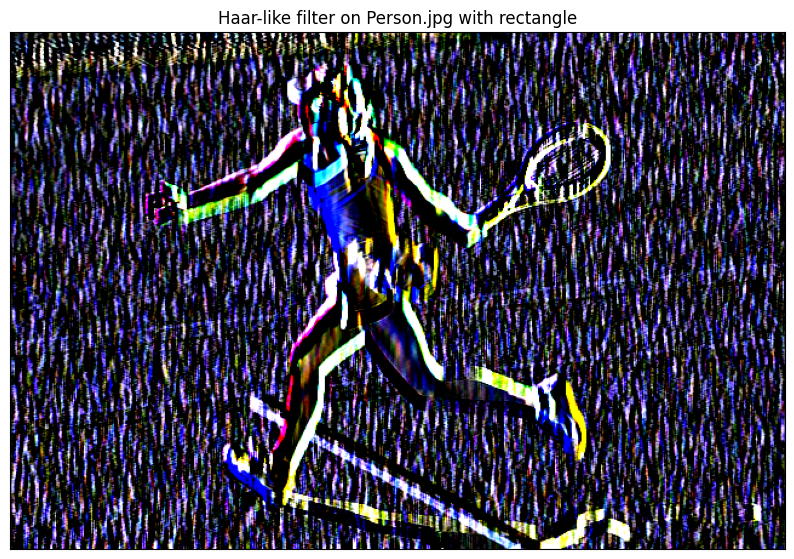

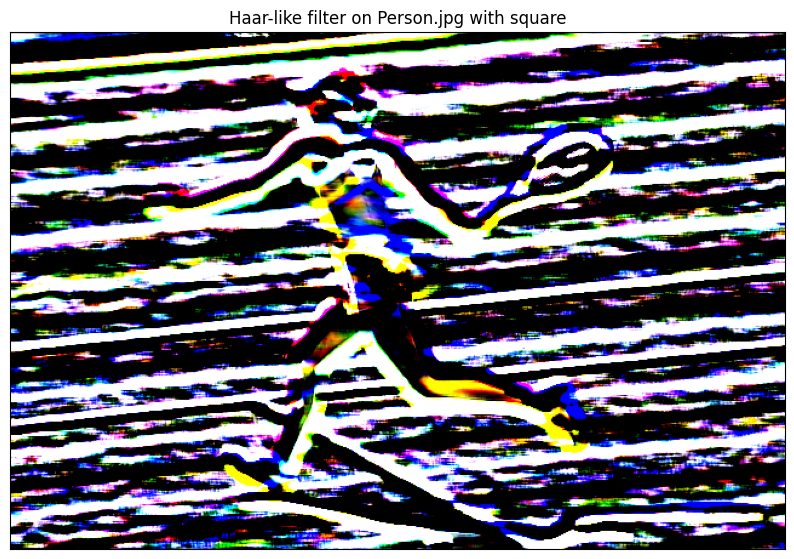

In [5]:
haar_re_dog_img_rgb = apply_haar_filter(dog_img_rgb, 'rectangle')
plt.figure(figsize=(10,10))
plt.imshow(haar_re_dog_img_rgb)
plt.title("Haar-like filter on Dog.jpg with rectangle"), plt.xticks([]), plt.yticks([])
plt.show()

haar_sq_dog_img_rgb = apply_haar_filter(dog_img_rgb, 'square')
plt.figure(figsize=(10,10))
plt.imshow(haar_sq_dog_img_rgb)
plt.title("Haar-like filter on Dog.jpg with square"), plt.xticks([]), plt.yticks([])
plt.show()

haar_re_person_img_rgb = apply_haar_filter(person_img_rgb, 'rectangle')
plt.figure(figsize=(10,10))
plt.imshow(haar_re_person_img_rgb)
plt.title("Haar-like filter on Person.jpg with rectangle"), plt.xticks([]), plt.yticks([])
plt.show()

haar_sq_person_img_rgb = apply_haar_filter(person_img_rgb, 'square')
plt.figure(figsize=(10,10))
plt.imshow(haar_sq_person_img_rgb)
plt.title("Haar-like filter on Person.jpg with square"), plt.xticks([]), plt.yticks([])
plt.show()


#### K-means Clustering

In [6]:
def concatenate_features(original_image, haar_feature1, haar_feature2):
    # Normalize and prepare each image
    norm_original = cv2.normalize(original_image, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    norm_haar1 = cv2.normalize(haar_feature1, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    norm_haar2 = cv2.normalize(haar_feature2, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    
    # Stack features along the third dimension
    stacked_features = np.dstack((norm_original, norm_haar1, norm_haar2))
    return stacked_features

In [7]:
def segment_image_kmeans(features, K=3):
    # Reshape the features to a 2D array where each row is a set of features for a pixel
    pixels = features.reshape((-1, features.shape[2]))
    kmeans = KMeans(n_clusters=K, random_state=0).fit(pixels)
    segmented_image = kmeans.labels_.reshape(features.shape[0], features.shape[1])
    return segmented_image

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


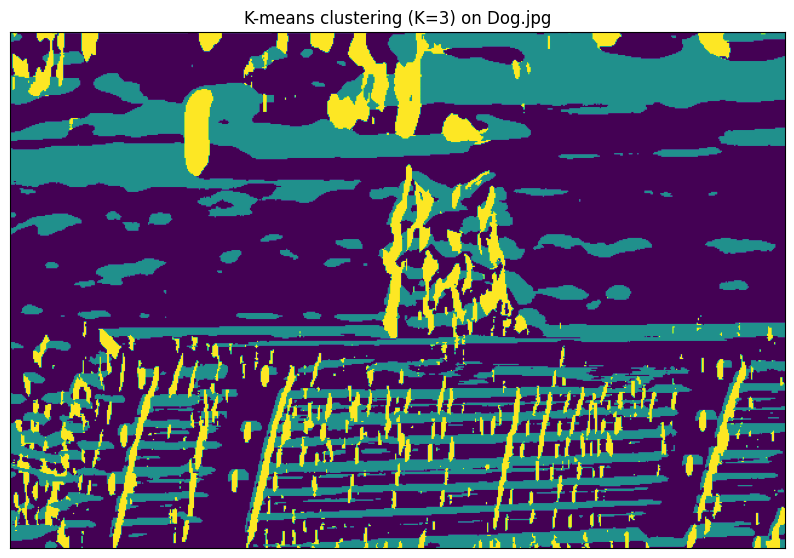

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


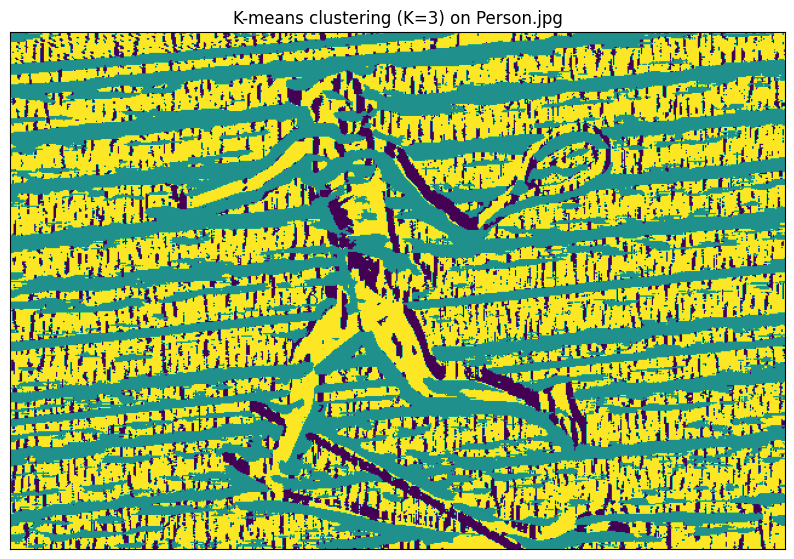

In [8]:
dog_features = concatenate_features(dog_img_rgb, haar_re_dog_img_rgb, haar_sq_dog_img_rgb)
person_features = concatenate_features(person_img_rgb, haar_re_person_img_rgb, haar_sq_person_img_rgb)

K_cluster_dog_img_rgb = segment_image_kmeans(dog_features)
plt.figure(figsize=(10,10))
plt.imshow(K_cluster_dog_img_rgb)
plt.title("K-means clustering (K=3) on Dog.jpg"), plt.xticks([]), plt.yticks([])
plt.show()

K_cluster_person_img_rgb = segment_image_kmeans(person_features)
plt.figure(figsize=(10,10))
plt.imshow(K_cluster_person_img_rgb)
plt.title("K-means clustering (K=3) on Person.jpg"), plt.xticks([]), plt.yticks([])
plt.show()

#### Mean-Shift Clustering

In [9]:
def segment_image_meanshift(features):
    pixels = np.float32(features.reshape((-1, features.shape[2]))) 
    bandwidth = estimate_bandwidth(pixels, quantile=0.2, n_samples=500)
    meanshift = MeanShift(bandwidth=bandwidth, bin_seeding=True).fit(pixels)
    segmented_image = meanshift.labels_.reshape(features.shape[0], features.shape[1])  
    return segmented_image

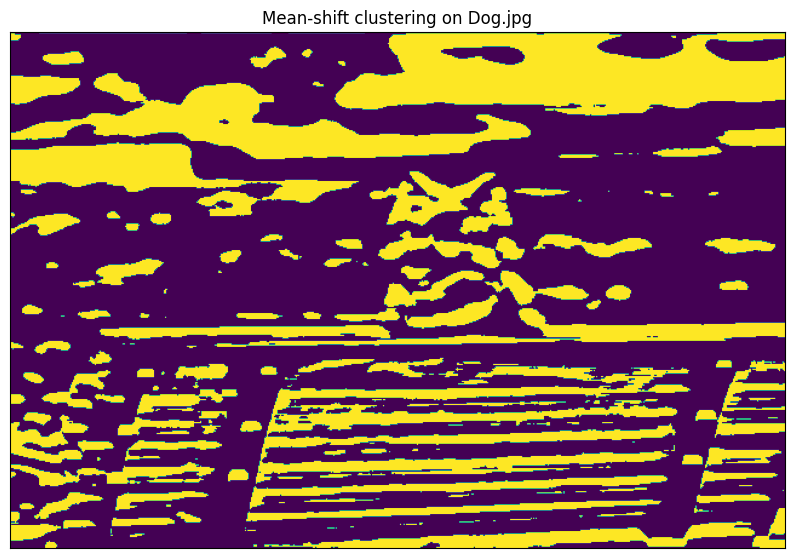

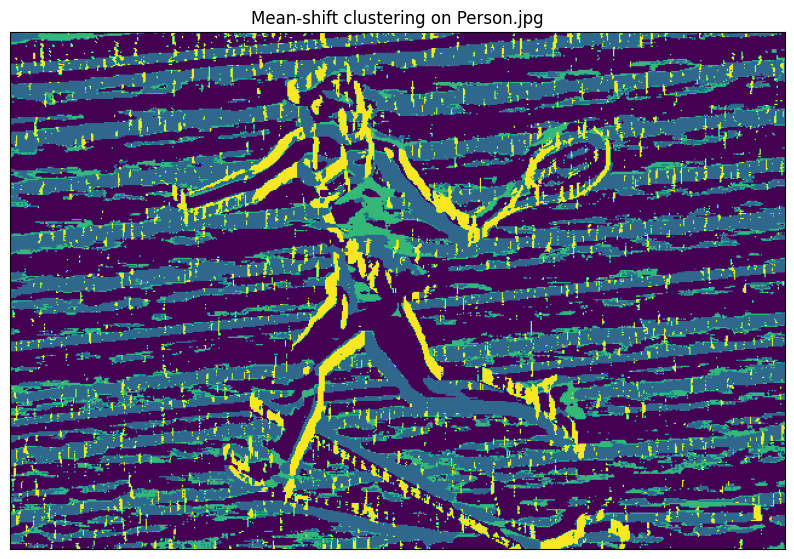

In [10]:
mean_cluster_dog_img_rgb = segment_image_meanshift(dog_features)
plt.figure(figsize=(10,10))
plt.imshow(mean_cluster_dog_img_rgb)
plt.title("Mean-shift clustering on Dog.jpg"), plt.xticks([]), plt.yticks([])
plt.show()

mean_cluster_person_img_rgb = segment_image_meanshift(person_features)
plt.figure(figsize=(10,10))
plt.imshow(mean_cluster_person_img_rgb)
plt.title("Mean-shift clustering on Person.jpg"), plt.xticks([]), plt.yticks([])
plt.show()

### K-means
K-means clustering is praised for its simplicity, efficiency, and scalability, making it a popular choice for image segmentation tasks where speed and straightforward implementation are prioritized. It works well with a variety of feature spaces, offering flexibility in segmentation applications. However, its requirement for pre-specifying the number of clusters can be limiting, as this number is often unknown in advance for images. Additionally, K-means is sensitive to initial centroid placement, which can affect the outcome, and assumes clusters are convex and isotropic, potentially reducing its effectiveness on complex images. The algorithm's sensitivity to noise and outliers due to its variance minimization objective further restricts its applicability in scenarios where these factors are prevalent.

### Mean-shift
Mean-shift clustering offers an intuitive approach to image segmentation by automatically determining the number of clusters, thus eliminating the need to pre-specify this value. This method is less sensitive to initialization and can identify clusters of arbitrary shapes, showcasing its adaptability to the inherent structures within images. Despite these advantages, Mean-shift's computational intensity, especially for large image datasets or in high-dimensional feature spaces, poses a significant limitation. Furthermore, the critical dependence on the bandwidth parameter, which requires careful tuning to avoid over- or under-segmentation, and its diminished efficiency in high-dimensional spaces due to the curse of dimensionality, underscore the practical challenges of applying Mean-shift clustering to image segmentation tasks.

# 2 Neural Network Implementation for Image Segmentation

### Mask-rnn
Using https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5 with modifications for our images

In [11]:
!git clone https://github.com/facebookresearch/detectron2.git

Cloning into 'detectron2'...
remote: Enumerating objects: 15528, done.
remote: Counting objects: 100% (253/253), done.
remote: Compressing objects: 100% (212/212), done.
remote: Total 15528 (delta 82), reused 185 (delta 41), pack-reused 15275
Receiving objects: 100% (15528/15528), 6.40 MiB | 10.06 MiB/s, done.
Resolving deltas: 100% (11193/11193), done.


In [12]:
%cd detectron2

/kaggle/working/detectron2


In [13]:
!pip install -U .

Processing /kaggle/working/detectron2
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 673.3 kB/s eta 0:00:00 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 1.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 7.2 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 23.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.5/53.5 kB 3.0 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=1254180 sha256=6cf738b6519929b424b7d72c80ad385bef74809fa77485e71d0309aa615442

In [14]:
pip wheel .

Processing /kaggle/working/detectron2
  Preparing metadata (setup.py) ... done
  Using cached pycocotools-2.0.7-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (1.1 kB)
  Using cached yacs-0.1.8-py3-none-any.whl.metadata (639 bytes)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.1 MB/s eta 0:00:00a 0:00:01
  Using cached fvcore-0.1.5.post20221221-py3-none-any.whl
  Using cached iopath-0.1.9-py3-none-any.whl.metadata (370 bytes)
  Using cached omegaconf-2.3.0-py3-none-any.whl.metadata (3.9 kB)
  Using cached hydra_core-1.3.2-py3-none-any.whl.metadata (5.5 kB)
  Using cached black-24.3.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (75 kB)
  Using cached packaging-24.0-py3-none-any.whl.metadata (3.2 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.6 MB/s eta 0:00:00
  Using cached antlr4_python3_runtime-4.9.3-py3-none-any.whl
  Using cached portalocker-2.8.2-py3-none-any.whl.metadata (8.5 kB)
     ━━━━━━━━━━━━━━━━━━

In [15]:
!pip show detectron2

Name: detectron2
Version: 0.6
Summary: Detectron2 is FAIR's next-generation research platform for object detection and segmentation.
Home-page: https://github.com/facebookresearch/detectron2
Author: FAIR
Author-email: 
License: 
Location: /opt/conda/lib/python3.10/site-packages
Requires: black, cloudpickle, fvcore, hydra-core, iopath, matplotlib, omegaconf, packaging, Pillow, pycocotools, tabulate, tensorboard, termcolor, tqdm, yacs
Required-by: 


In [16]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Mon_Apr__3_17:16:06_PDT_2023
Cuda compilation tools, release 12.1, V12.1.105
Build cuda_12.1.r12.1/compiler.32688072_0
torch:  2.1 ; cuda:  2.1.2
detectron2: 0.6


In [17]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

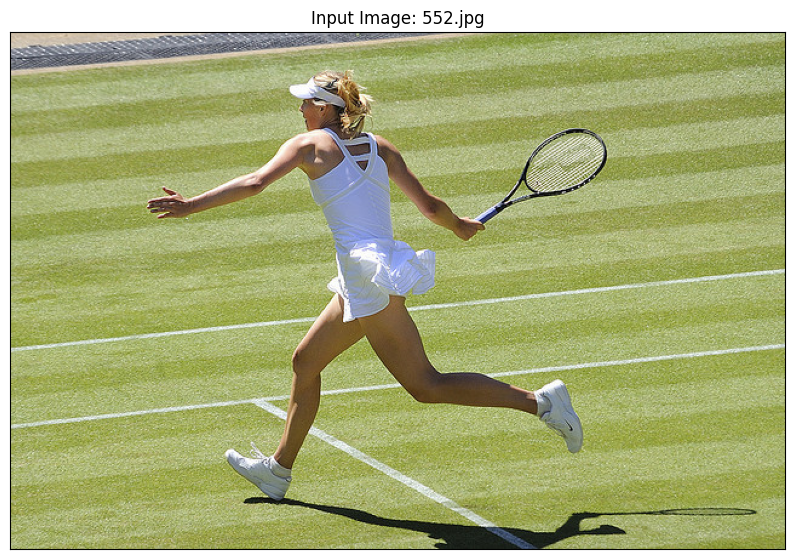

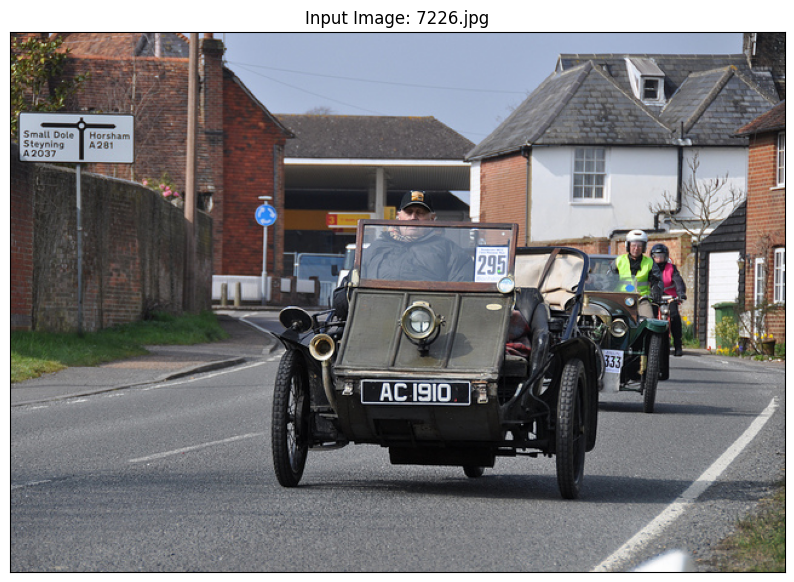

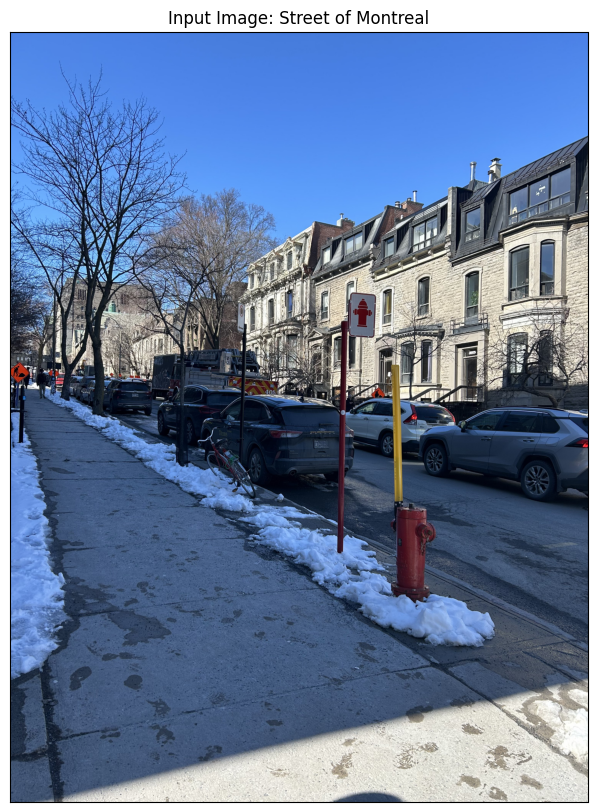

In [18]:
person_img = cv2.imread(part2_path + "000000000552.jpg")
person_img_rgb = cv2.cvtColor(person_img, cv2.COLOR_BGR2RGB)

car_img = cv2.imread(part2_path + "000000007226.jpg")
car_img_rgb = cv2.cvtColor(car_img, cv2.COLOR_BGR2RGB)

street_img = cv2.imread(other_path + "IMG_4550.jpg")
street_img_rgb = cv2.cvtColor(street_img, cv2.COLOR_BGR2RGB)


plt.figure(figsize=(10,10))
plt.imshow(person_img_rgb)
plt.title("Input Image: 552.jpg"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(car_img_rgb)
plt.title("Input Image: 7226.jpg"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(street_img_rgb)
plt.title("Input Image: Street of Montreal"), plt.xticks([]), plt.yticks([])
plt.show()

In [19]:
# For the 552 image

cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(person_img_rgb)

[04/12 04:47:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:00, 218MB/s]                             
/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


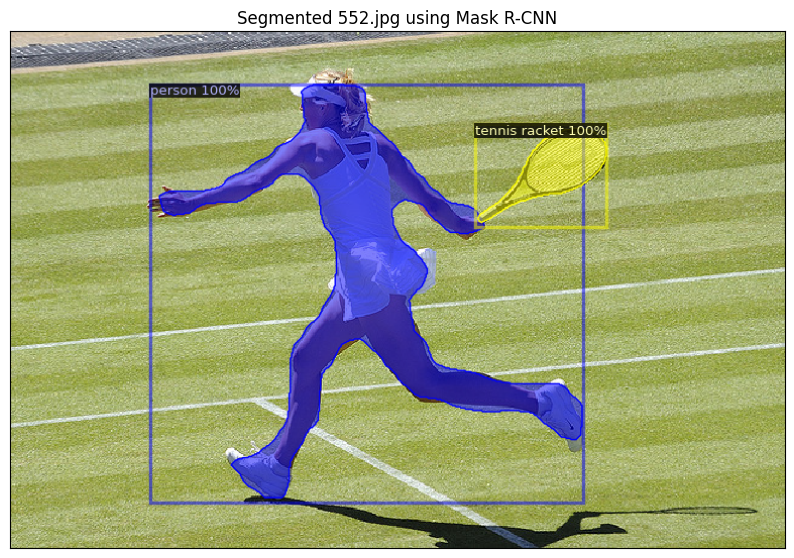

In [20]:
v = Visualizer(person_img_rgb[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))


plt.figure(figsize=(10,10))
plt.imshow(out.get_image()[:, :, ::-1])
plt.title("Segmented 552.jpg using Mask R-CNN"), plt.xticks([]), plt.yticks([])
plt.show()


[04/12 04:47:29 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


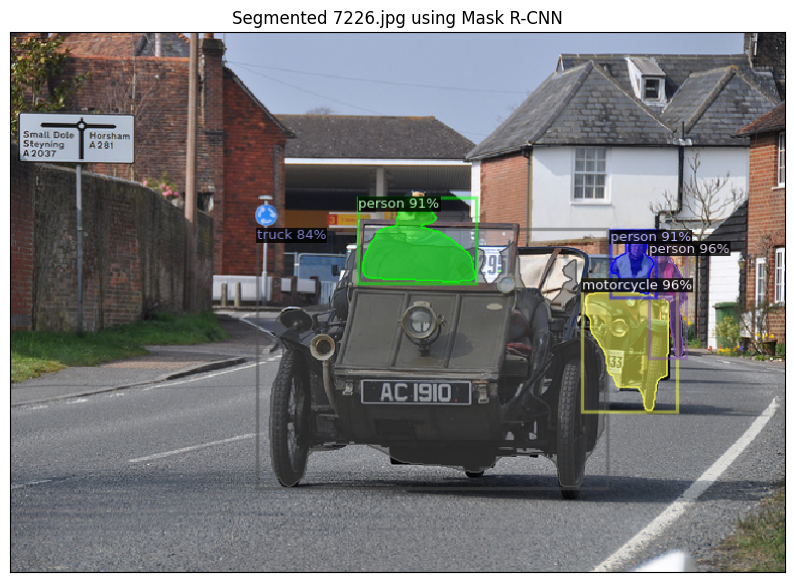

In [21]:
predictor = DefaultPredictor(cfg)
outputs = predictor(car_img_rgb)
v = Visualizer(car_img_rgb[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))


plt.figure(figsize=(10,10))
plt.imshow(out.get_image()[:, :, ::-1])
plt.title("Segmented 7226.jpg using Mask R-CNN"), plt.xticks([]), plt.yticks([])
plt.show()

[04/12 04:48:13 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


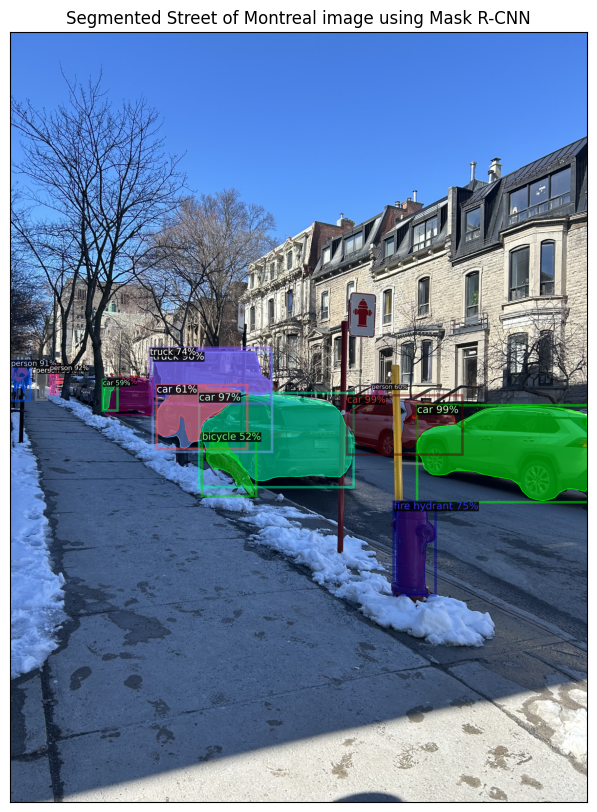

In [22]:
predictor = DefaultPredictor(cfg)
outputs = predictor(street_img_rgb)
v = Visualizer(street_img_rgb[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))


plt.figure(figsize=(10,10))
plt.imshow(out.get_image()[:, :, ::-1])
plt.title("Segmented Street of Montreal image using Mask R-CNN"), plt.xticks([]), plt.yticks([])
plt.show()

### YOLOv8n-seg
From https://docs.ultralytics.com/modes/predict/#plotting-results (same as A4)


In [23]:
%cd ..
!pip install ultralytics

/kaggle/working
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 583.2 kB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.4/750.4 kB 4.9 MB/s eta 0:00:0000:0100:01


In [24]:
from ultralytics import YOLO

# Load a pretrained YOLOv8n model
model = YOLO('yolov8n.pt')

100%|██████████| 6.23M/6.23M [00:00<00:00, 73.5MB/s]


In [25]:
# 552 image
results = model.predict(person_img)

for i, r in enumerate(results):
    im_bgr = r.plot()  # BGR-order numpy array
    cv2.imwrite(f'results{i}.jpg', im_bgr)  # Save the image


0: 448x640 1 person, 1 tennis racket, 96.3ms
Speed: 3.5ms preprocess, 96.3ms inference, 2.5ms postprocess per image at shape (1, 3, 448, 640)


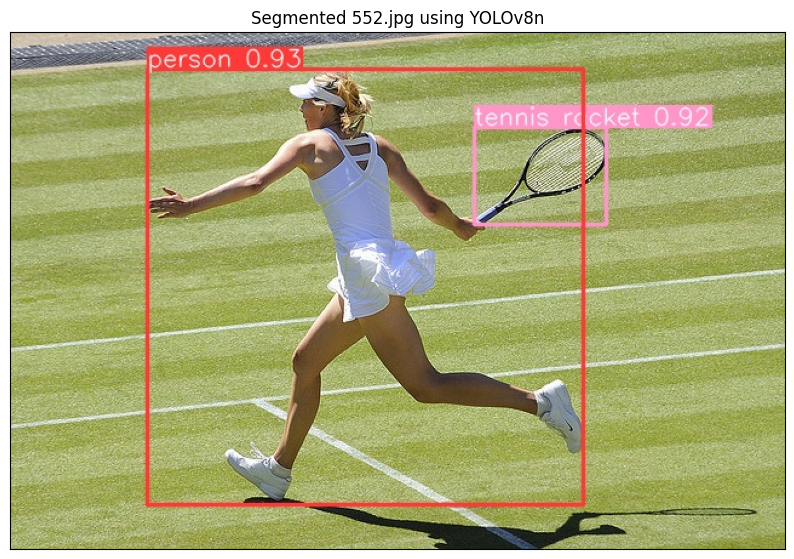

In [27]:
# TODO CHANGE THE PATH 
result_img = cv2.imread(output_path + "results0.jpg")
result_img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(result_img_rgb)
plt.title("Segmented 552.jpg using YOLOv8n"), plt.xticks([]), plt.yticks([])
plt.show()

In [29]:
# 7226 image
results = model.predict(car_img)

for i, r in enumerate(results):
    im_bgr = r.plot()  # BGR-order numpy array
    cv2.imwrite(f'results{i}.jpg', im_bgr)  # Save the image



0: 448x640 4 persons, 1 truck, 9.7ms
Speed: 3.9ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


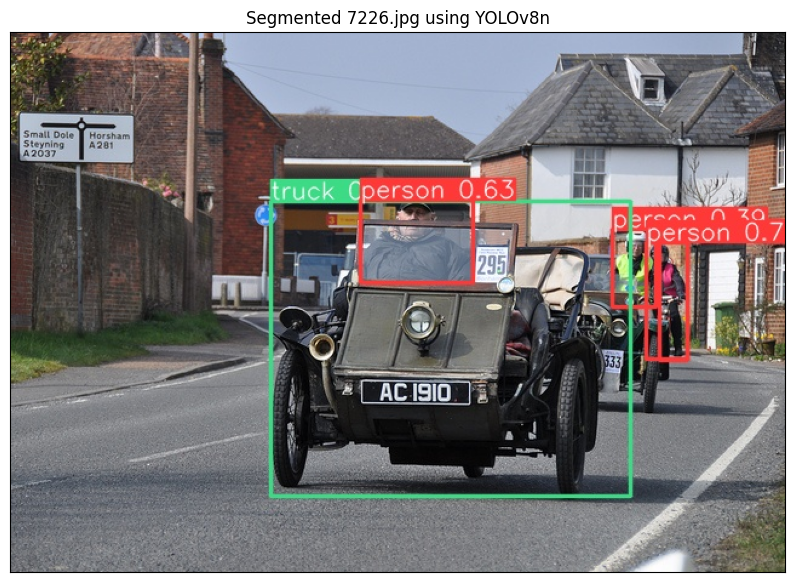

In [31]:
result_img = cv2.imread(output_path + "results0.jpg")
result_img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(result_img_rgb)
plt.title("Segmented 7226.jpg using YOLOv8n"), plt.xticks([]), plt.yticks([])
plt.show()

In [32]:
# 7226 image
results = model.predict(street_img)

for i, r in enumerate(results):
    im_bgr = r.plot()  # BGR-order numpy array
    cv2.imwrite(f'results{i}.jpg', im_bgr)  # Save the image



0: 640x480 1 person, 7 cars, 1 fire hydrant, 98.2ms
Speed: 11.4ms preprocess, 98.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


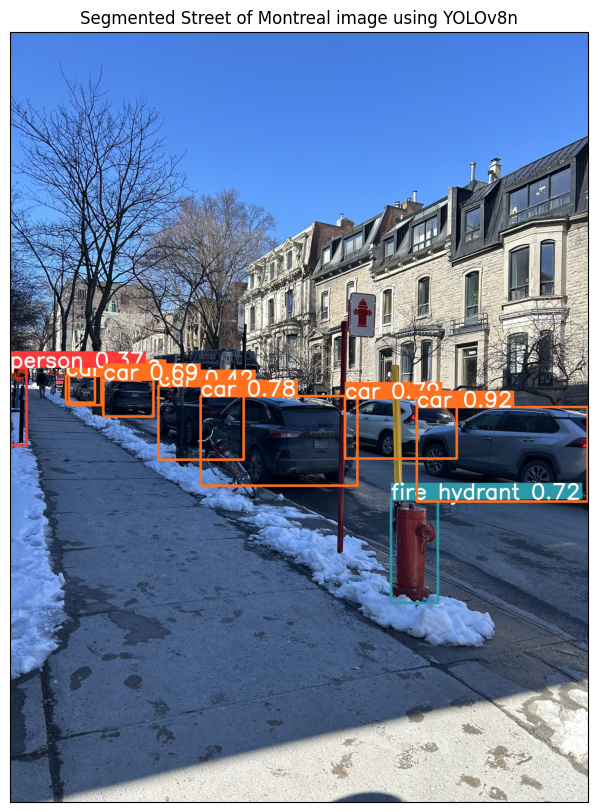

In [33]:
result_img = cv2.imread(output_path + "results0.jpg")
result_img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(result_img_rgb)
plt.title("Segmented Street of Montreal image using YOLOv8n"), plt.xticks([]), plt.yticks([])
plt.show()

#### Compare the performance of these two models and explain the steps that Mask R-CNN took to achieve the final result
The comparison between Mask R-CNN and YOLOv8n-seg reveals distinct performance characteristics for each model in image segmentation tasks. Mask R-CNN is noted for its superior accuracy, thanks to its detailed segmentation capabilities, which, however, come at the cost of slower processing times. Conversely, YOLOv8n-seg offers much faster prediction speeds, making it suitable for real-time applications, although it tends to be less precise than Mask R-CNN.

Mask R-CNN extends the Faster R-CNN architecture by adding a branch for predicting segmentation masks on each Region of Interest (RoI), in parallel with the existing branch for classification and bounding box regression. The steps involved are:

1. **Feature Extraction**: Mask R-CNN utilizes a backbone structure (such as ResNet combined with a Feature Pyramid Network) to extract a feature map from the input image.

2. **Region Proposal Network (RPN)**: On top of the feature map, the RPN proposes candidate object bounding boxes.

3. **RoI Pooling**: The proposed regions are aligned and pooled to a fixed size to be processed by the subsequent layers. Mask R-CNN uses RoIAlign instead of the traditional RoIPool, which more accurately preserves spatial details by using bilinear interpolation.

4. **Classification and Bounding Box Regression**: Each RoI is fed into fully connected layers that classify the object and refine its bounding box.

5. **Mask Prediction**: Simultaneously, for each RoI, a segmentation mask is predicted. This is done through a small fully convolutional network applied to each RoI, outputting a binary mask that indicates the presence of the object within the RoI at the pixel level.

6. **Non-maximum Suppression (NMS)**: Finally, to reduce redundancy and overlaps, NMS is applied to the output boxes based on their scores and the IoU (Intersection over Union) metric.

This intricate process allows Mask R-CNN to achieve high-quality segmentation and detailed delineation of objects, making it highly effective in scenarios where such detail is necessary.
